<a href="https://colab.research.google.com/github/ashishpatel26/SRCNN_Step_by_Step/blob/main/ESRGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Demo esrgan-tf2 on single image input
This notebooks shows the testing results of the ESRGAN model trained on Tensorflow2.0+.

## Setup Environment



In [ ]:
# !git clone https://github.com/peteryuX/esrgan-tf2.git
%cd esrgan-tf2/
!pip install -r requirements.txt

/content/esrgan-tf2


## Dowload Pretrained Model

In [ ]:
from google_drive_downloader import GoogleDriveDownloader as gdd

gdd.download_file_from_google_drive(file_id='1ckihm-YJ5iwayBzUNPDVwyo9u54UtZyE',
                                    dest_path='./esrgan_inference.zip',
                                    unzip=True)
!mkdir -p checkpoints/
!mv esrgan_inference checkpoints/esrgan
!rm esrgan_inference.zip

Unzipping...Done.


## The Source Image

In [ ]:
import shutil
shutil.unpack_archive('/content/mri.zip', '.')

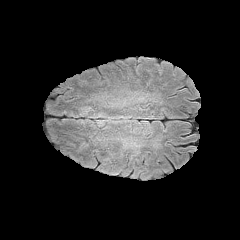

In [ ]:
from IPython.display import Image
Image(filename='/content/esrgan-tf2/train/BraTS20_Training_002_flair_100.png')

## Prediction Result from Testing Script

2021-04-24 10:30:00.075953: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer.so.6'; dlerror: libnvinfer.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2021-04-24 10:30:00.076082: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libnvinfer_plugin.so.6'; dlerror: libnvinfer_plugin.so.6: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2021-04-24 10:30:00.076106: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:30] Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
I0424 10:30:00.981546 140163061704576 utils.py:30] Detect 1 Physical GPUs, 1 Logical GPUs.
[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Tra

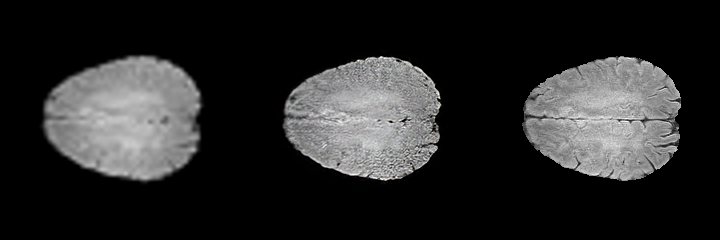

In [ ]:
!python test.py --cfg_path="./configs/esrgan.yaml" --img_path="/content/esrgan-tf2/train/BraTS20_Training_002_flair_100.png"
Image(filename='/content/esrgan-tf2/Bic_SR_HR_BraTS20_Training_002_flair_100.png')

In [ ]:
from absl import app, flags, logging
# from absl.flags import FLAGS
import cv2
import os
import pathlib
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import tensorflow as tf

from modules.models import RRDB_Model
from modules.utils import (load_yaml, set_memory_growth, imresize_np,
                           tensor2img, rgb2ycbcr, create_lr_hr_pair,
                           calculate_psnr, calculate_ssim)

In [ ]:
def main(img_path, cfg_path, gpu):
    # init
    os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
    os.environ['CUDA_VISIBLE_DEVICES'] = gpu

    logger = tf.get_logger()
    logger.disabled = True
    logger.setLevel(logging.FATAL)
    set_memory_growth()

    cfg = load_yaml(cfg_path)

    # define network
    model = RRDB_Model(None, cfg['ch_size'], cfg['network_G'])

    # load checkpoint
    checkpoint_dir = './checkpoints/' + cfg['sub_name']
    checkpoint = tf.train.Checkpoint(model=model)

    if tf.train.latest_checkpoint(checkpoint_dir):
        checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
        print("[*] load ckpt from {}.".format(tf.train.latest_checkpoint(checkpoint_dir)))
    else:
        print("[*] Cannot find ckpt from {}.".format(checkpoint_dir))
        exit()

    # evaluation
    if img_path:
        print("[*] Processing on single image {}".format(img_path))
        raw_img = cv2.imread(img_path)
        lr_img, hr_img = create_lr_hr_pair(raw_img, cfg['scale'])

        sr_img = tensor2img(model(lr_img[np.newaxis, :] / 255))
        bic_img = imresize_np(lr_img, cfg['scale']).astype(np.uint8)

        psnr_bic = calculate_psnr(rgb2ycbcr(bic_img), rgb2ycbcr(hr_img))
        psnr_sr = calculate_psnr(rgb2ycbcr(sr_img), rgb2ycbcr(hr_img))

        ssim_bic = calculate_ssim(rgb2ycbcr(bic_img), rgb2ycbcr(hr_img))
        ssim_sr = calculate_ssim(rgb2ycbcr(sr_img), rgb2ycbcr(hr_img))
        str_format = "{}              PSNR = {:.4f}db           SSIM  = {:.4f}"
        result = str_format.format(os.path.basename(img_path), psnr_sr, ssim_sr)
        # print(result)
        
        result_img_path = '/content/ESRGAN_Result/Bic_SR_HR_' + os.path.basename(img_path)
        print("[*] write the result image {}".format(result_img_path))
        results_img = np.concatenate((bic_img, sr_img, hr_img), 1)
        
        plt.figure(figsize=(14, 7))
        plt.imshow(results_img)
        plt.title(f'{result}')
        plt.xlabel("Low Resolution                                                         Generated Image                                                         Ground Truth", fontsize=10)
        plt.xticks([])
        plt.yticks([])
        plt.savefig(result_img_path, dpi=100, pad_inches=0.0, bbox_inches='tight')
        plt.show()
        # cv2.imwrite(result_img_path, results_img)
    else:
        print("[*] Processing on Set5 and Set14, and write results")
        results_path = './results/' + cfg['sub_name'] + '/'

        for key, path in cfg['test_dataset'].items():
            print("'{}' form {}\n  PSNR/SSIM".format(key, path))
            dataset_name = key.replace('_path', '')
            pathlib.Path(results_path + dataset_name).mkdir(parents=True, exist_ok=True)

            for img_name in os.listdir(path):
                raw_img = cv2.imread(os.path.join(path, img_name))
                lr_img, hr_img = create_lr_hr_pair(raw_img, cfg['scale'])

                sr_img = tensor2img(model(lr_img[np.newaxis, :] / 255))
                bic_img = imresize_np(lr_img, cfg['scale']).astype(np.uint8)

                psnr_bic = calculate_psnr(rgb2ycbcr(bic_img), rgb2ycbcr(hr_img))
                psnr_sr = calculate_psnr(rgb2ycbcr(sr_img), rgb2ycbcr(hr_img))

                ssim_bic = calculate_ssim(rgb2ycbcr(bic_img), rgb2ycbcr(hr_img))
                ssim_sr = calculate_ssim(rgb2ycbcr(sr_img), rgb2ycbcr(hr_img))

                str_format = "  [{}] Bic={:.2f}db/{:.2f}, SR={:.2f}db/{:.2f}"
                result = str_format.format(os.path.basename(img_path), psnr_bic, psnr_sr, psnr_sr, ssim_sr)
                result_img_path = os.path.join(results_path + dataset_name, 'Bic_SR_HR_' + img_name)
                results_img = np.concatenate((bic_img, sr_img, hr_img), 1)

                plt.figure(figsize=(14, 7))
                plt.imshow(results_img)
                plt.title(f'{result}')
                plt.xlabel("Low Resolution                                                         Generated Image                                                         Ground Truth", fontsize=10)
                plt.xticks([])
                plt.yticks([])
                plt.savefig(result_img_path, dpi=100, pad_inches=0.0, bbox_inches='tight')
                plt.show()
                # cv2.imwrite(result_img_path, results_img)

        print("[*] write the visual results in {}".format(results_path))
    return psnr_sr, ssim_sr

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_66.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_66.png


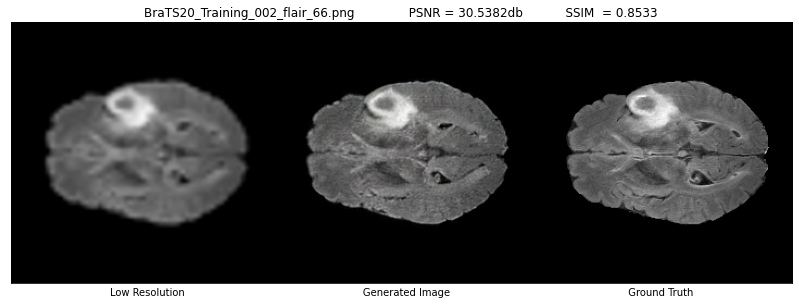

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_95.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_95.png


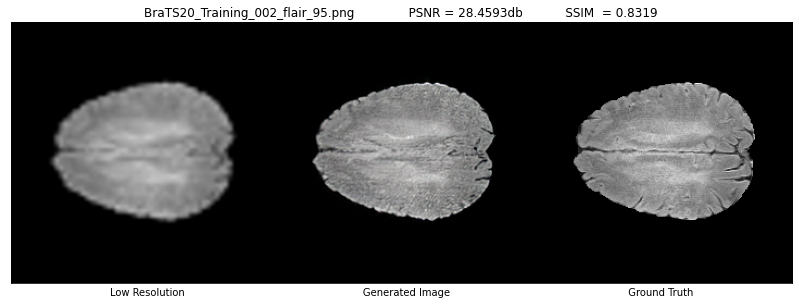

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_64.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_64.png


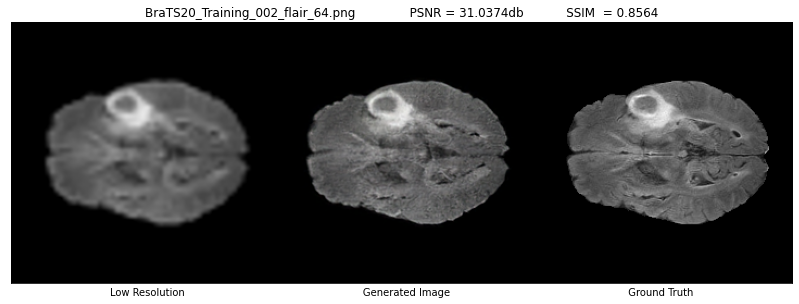

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_38.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_38.png


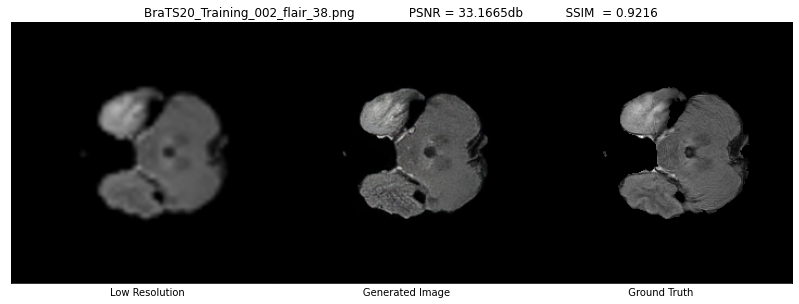

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_77.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_77.png


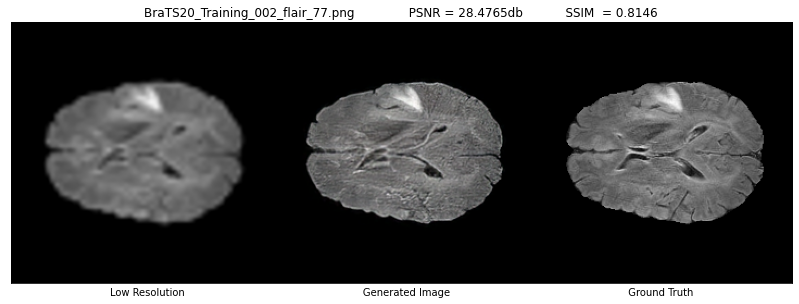

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_58.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_58.png


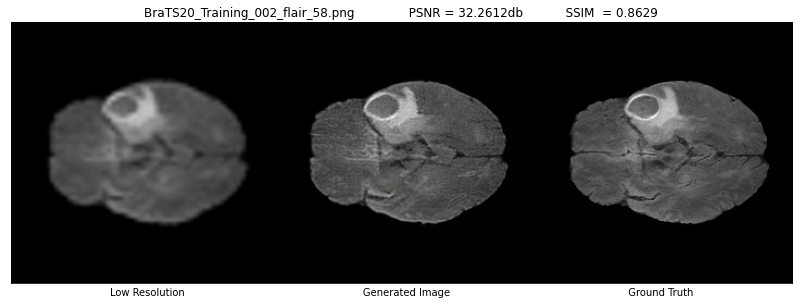

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_65.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_65.png


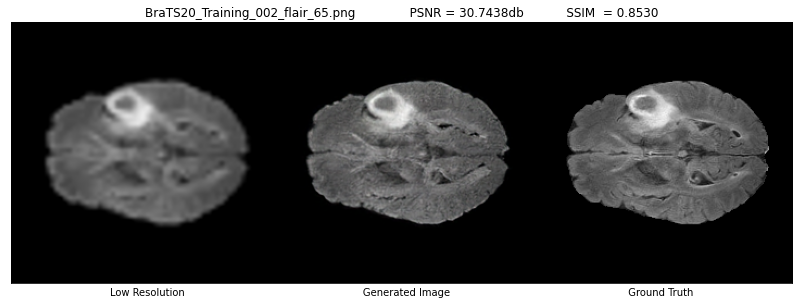

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_106.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_106.png


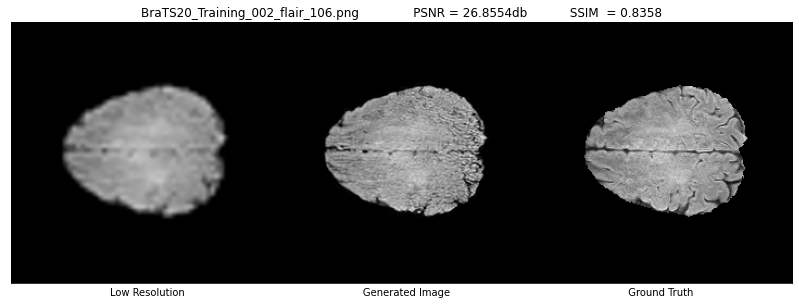

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_61.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_61.png


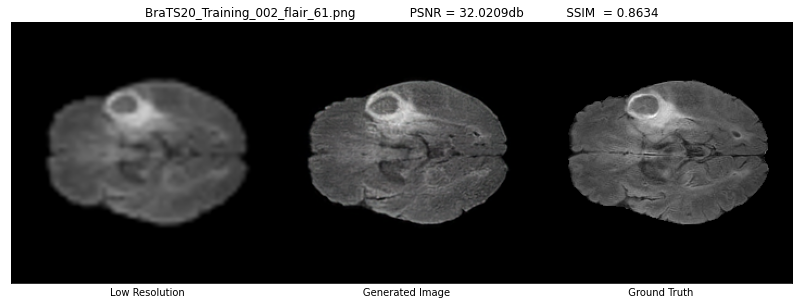

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_93.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_93.png


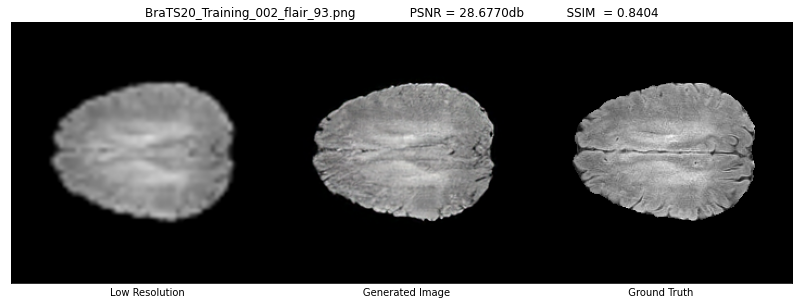

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_36.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_36.png


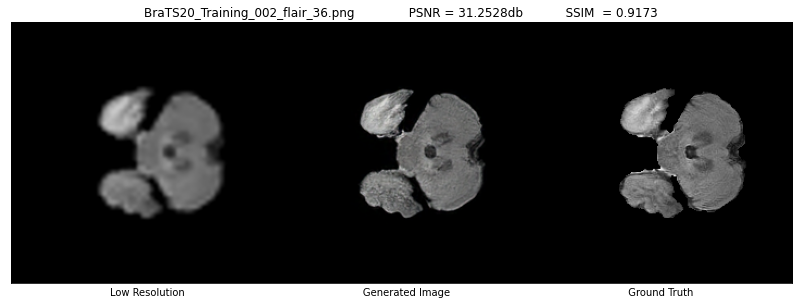

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_103.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_103.png


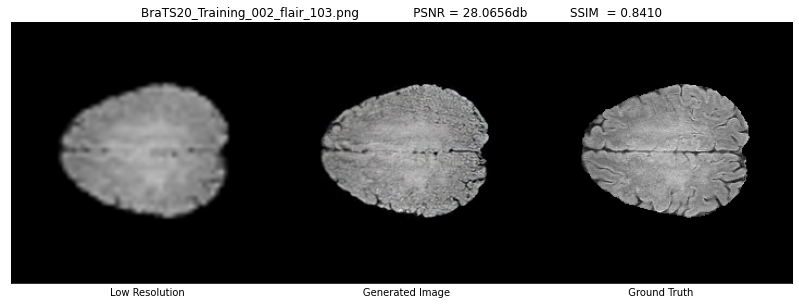

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_34.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_34.png


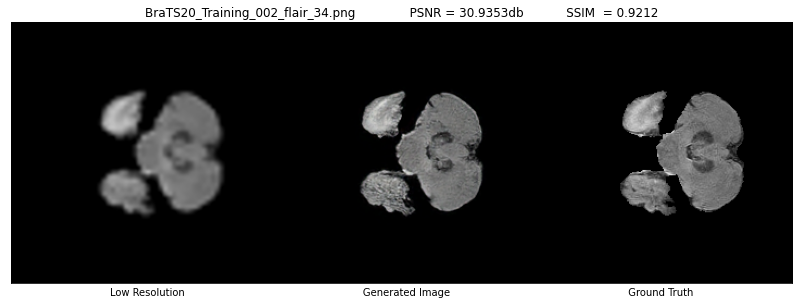

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_83.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_83.png


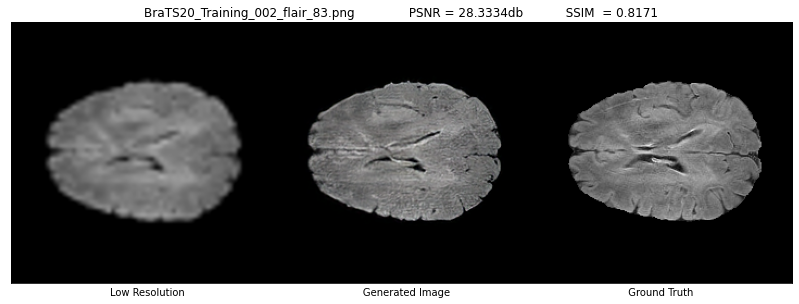

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_86.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_86.png


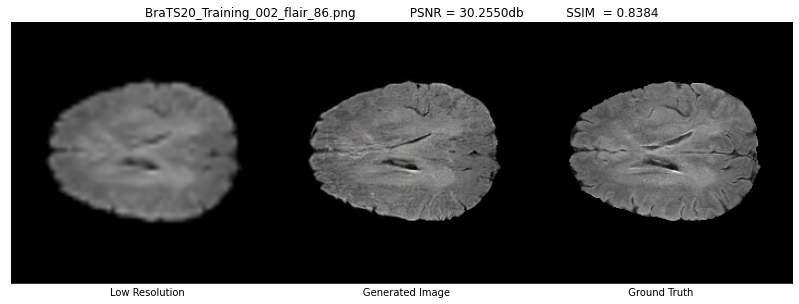

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_62.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_62.png


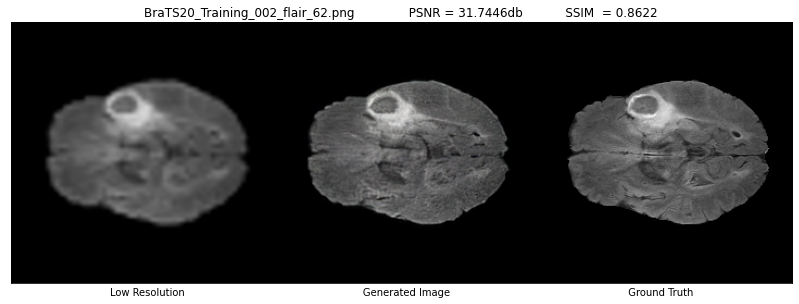

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_56.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_56.png


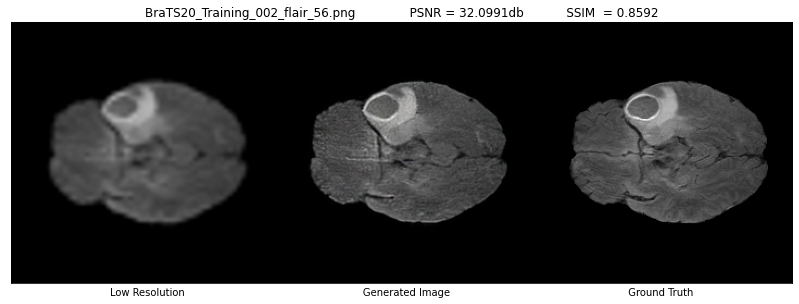

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_102.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_102.png


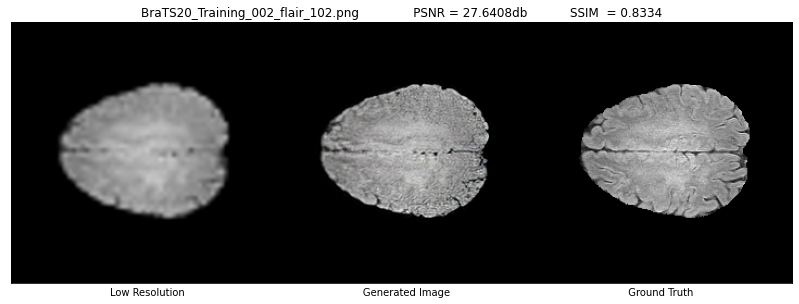

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_112.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_112.png


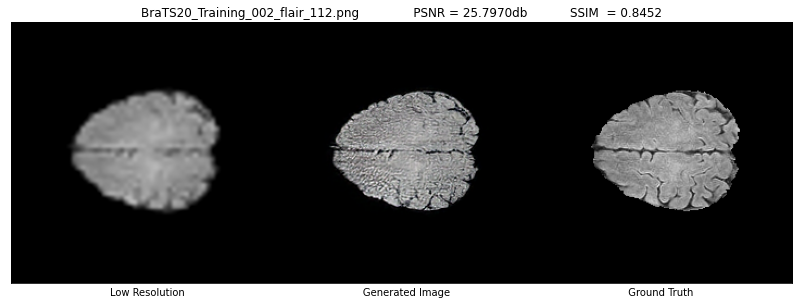

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_74.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_74.png


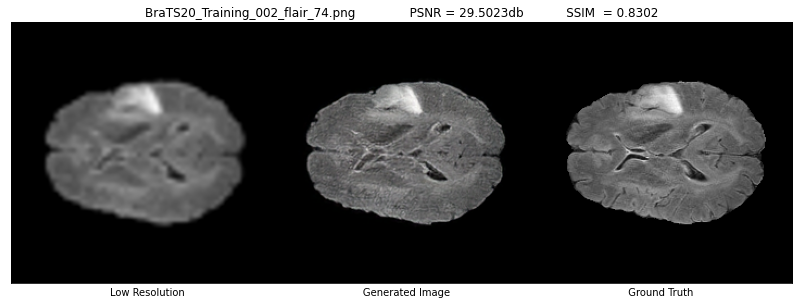

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_99.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_99.png


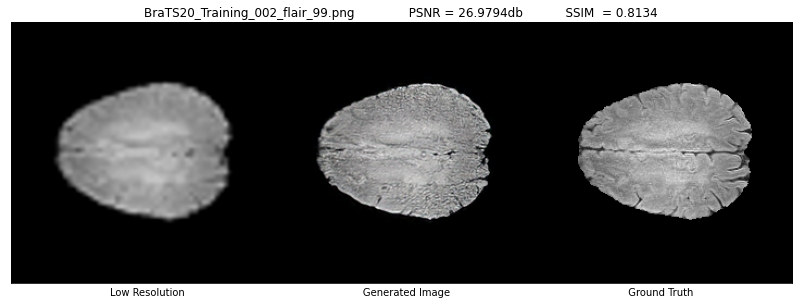

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_115.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_115.png


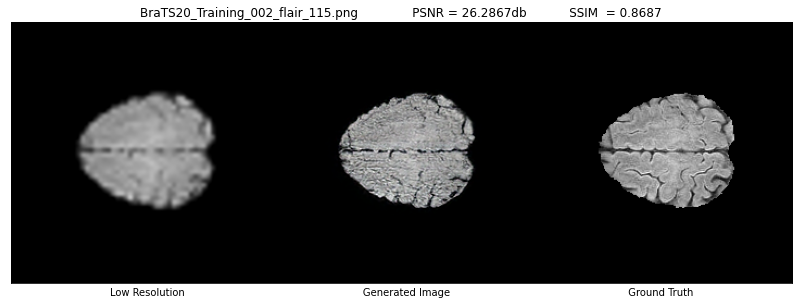

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_42.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_42.png


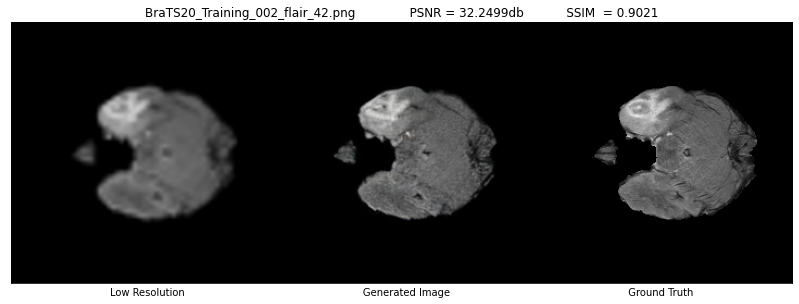

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_40.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_40.png


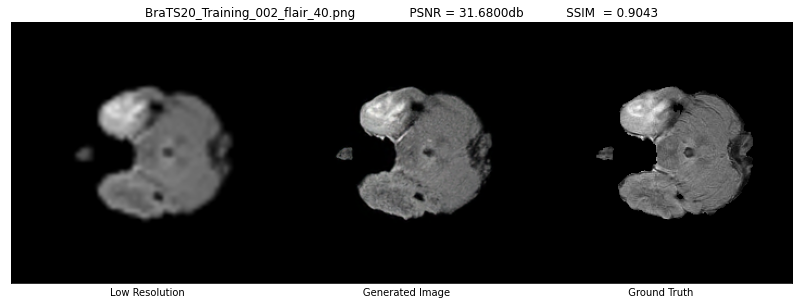

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_89.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_89.png


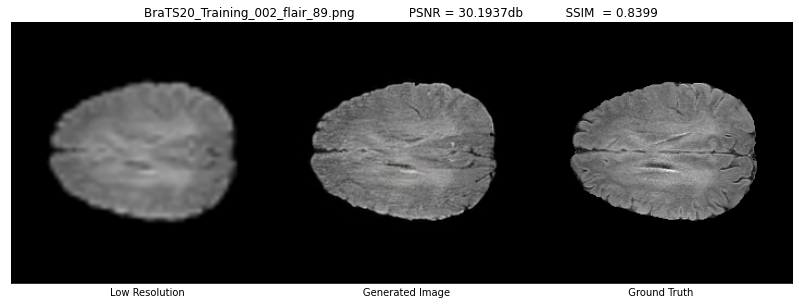

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_71.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_71.png


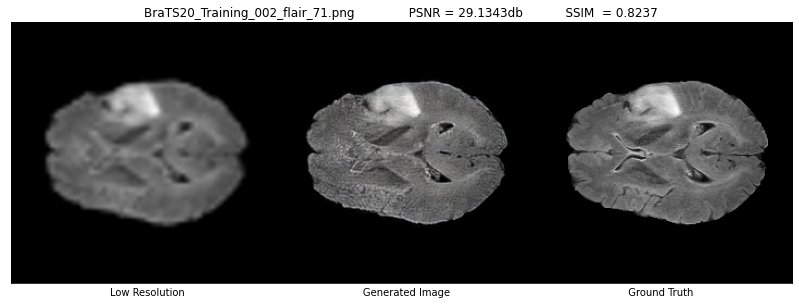

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_101.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_101.png


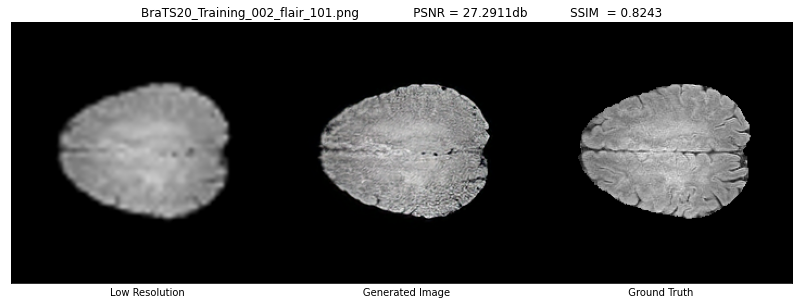

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_47.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_47.png


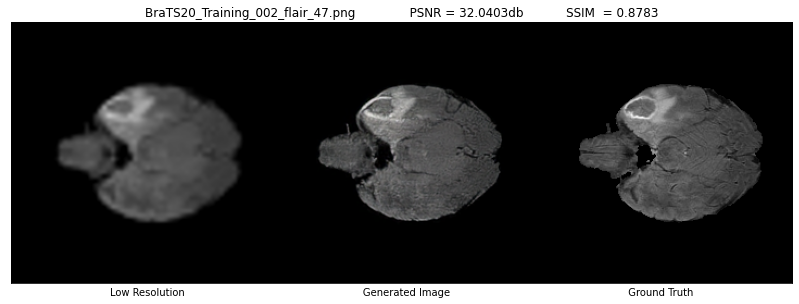

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_107.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_107.png


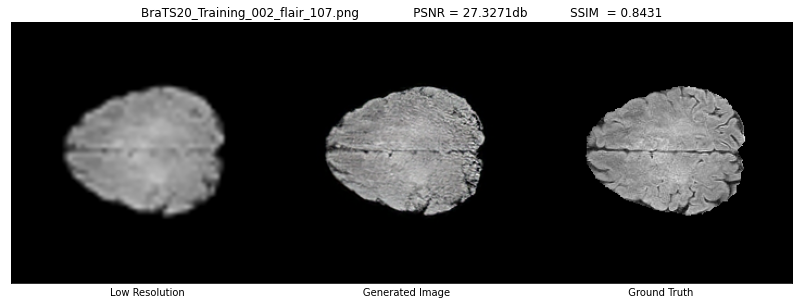

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_96.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_96.png


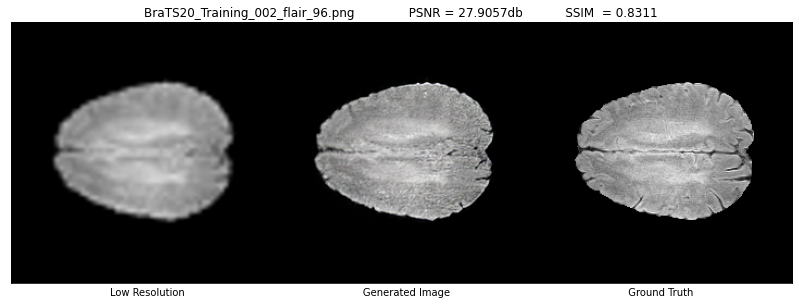

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_57.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_57.png


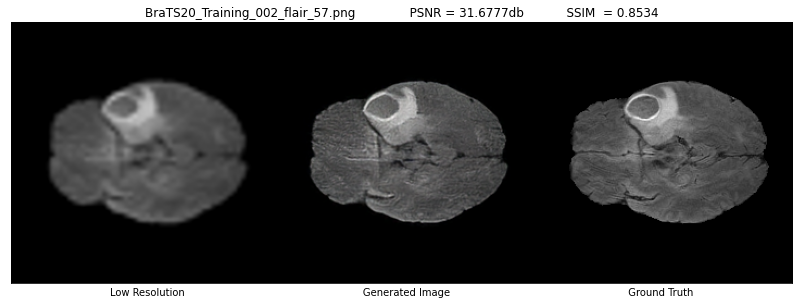

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_108.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_108.png


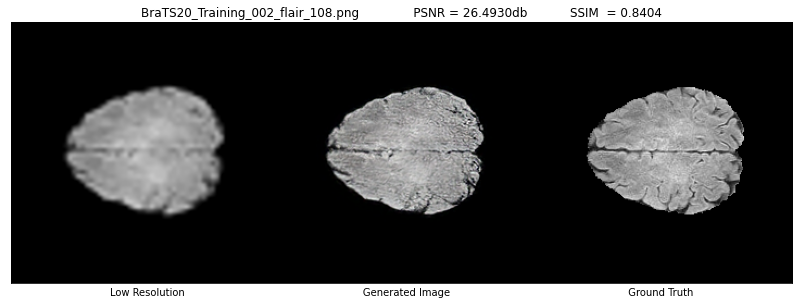

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_122.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_122.png


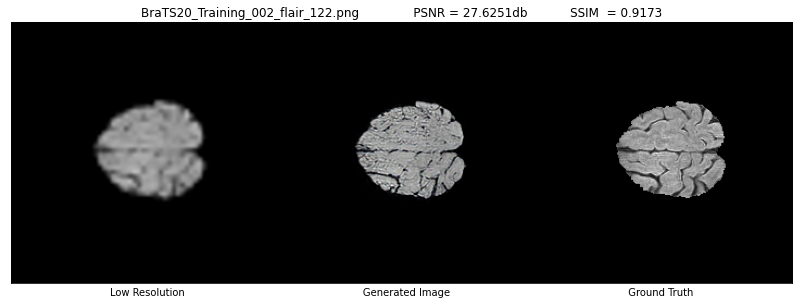

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_69.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_69.png


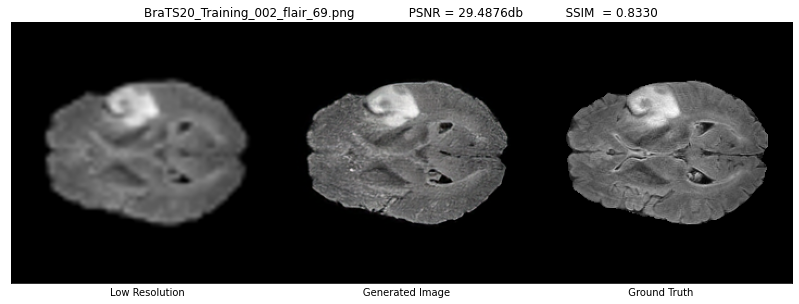

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_121.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_121.png


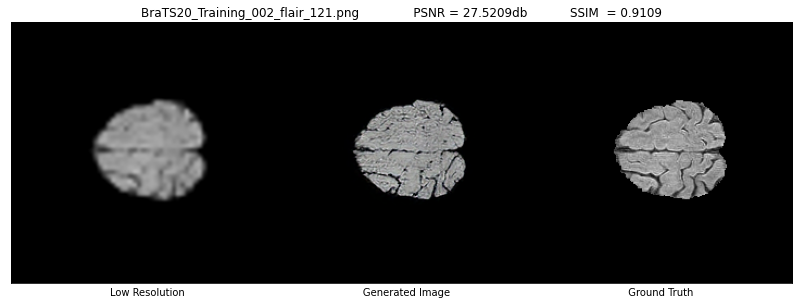

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_63.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_63.png


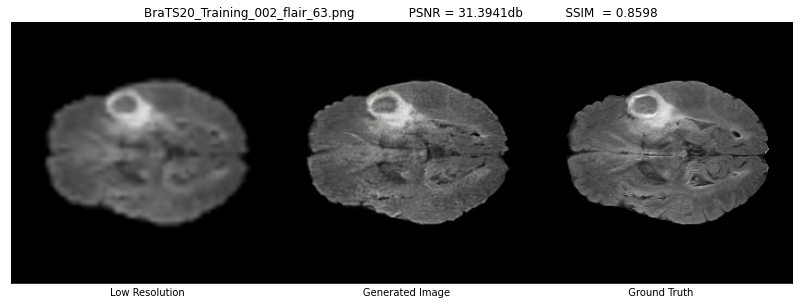

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_78.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_78.png


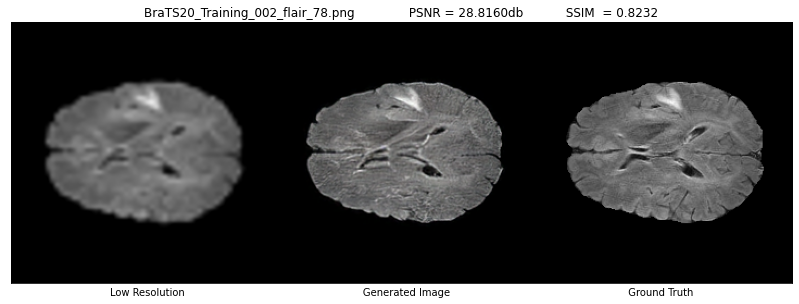

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_119.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_119.png


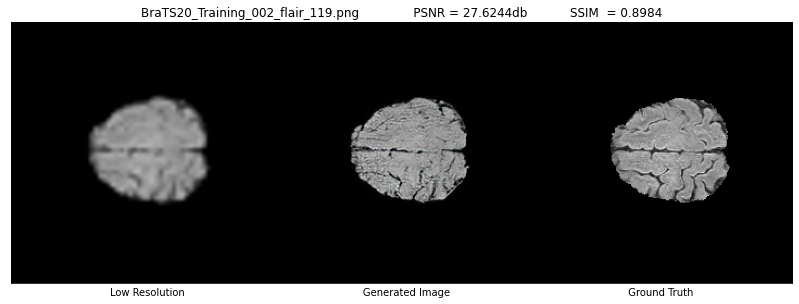

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_41.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_41.png


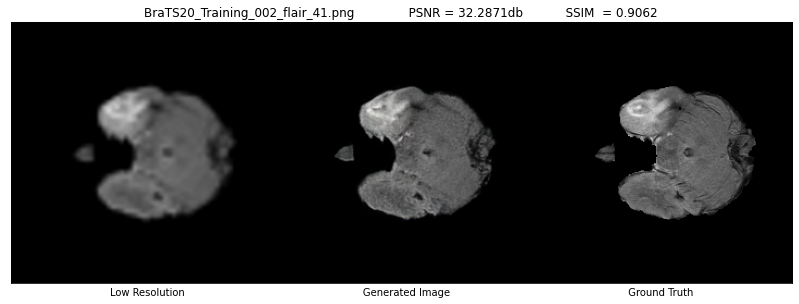

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_76.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_76.png


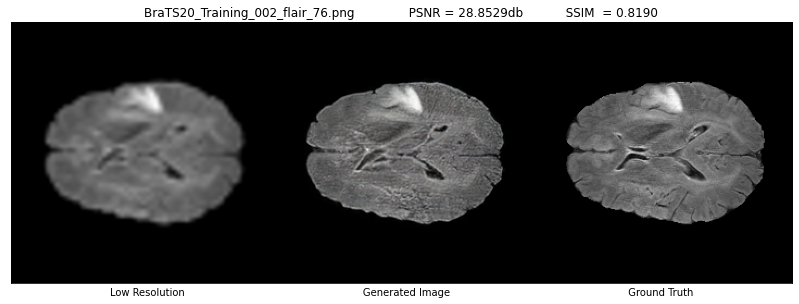

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_113.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_113.png


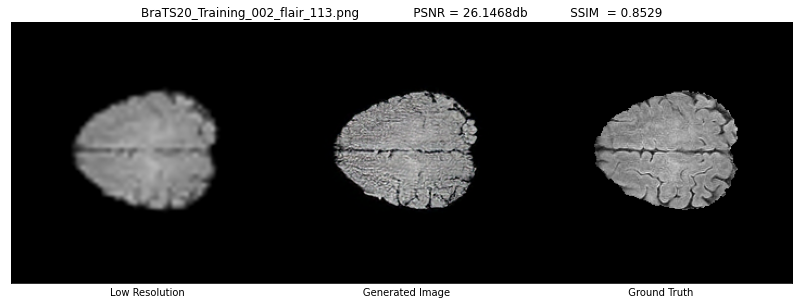

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_55.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_55.png


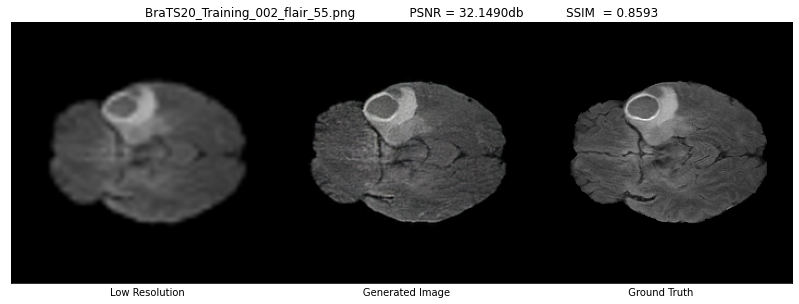

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_81.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_81.png


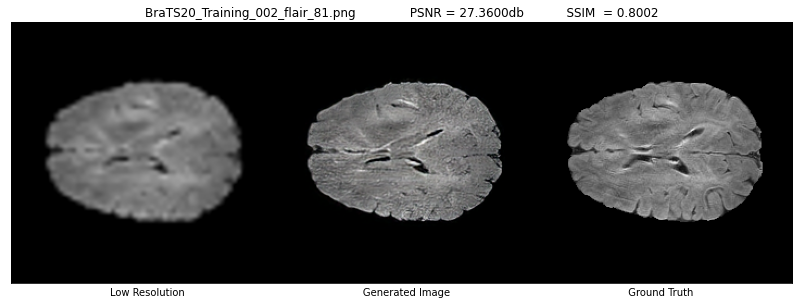

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_79.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_79.png


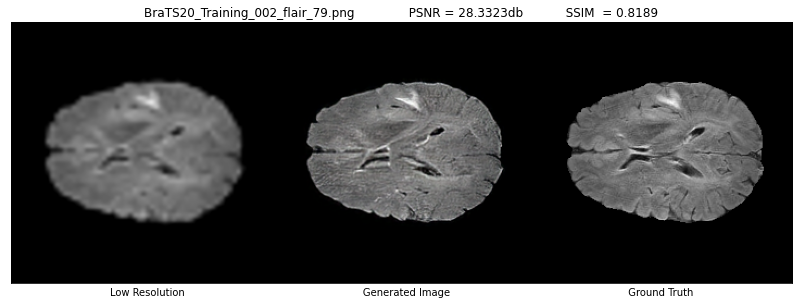

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_43.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_43.png


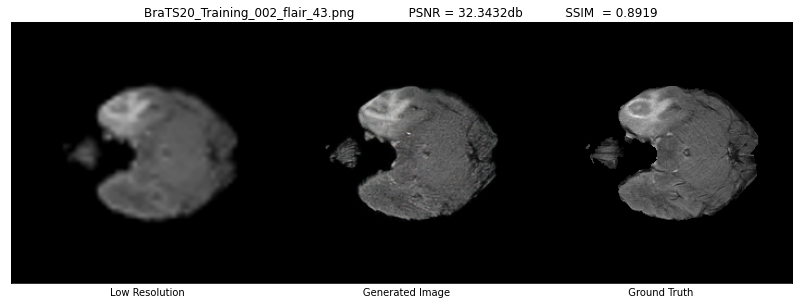

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_60.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_60.png


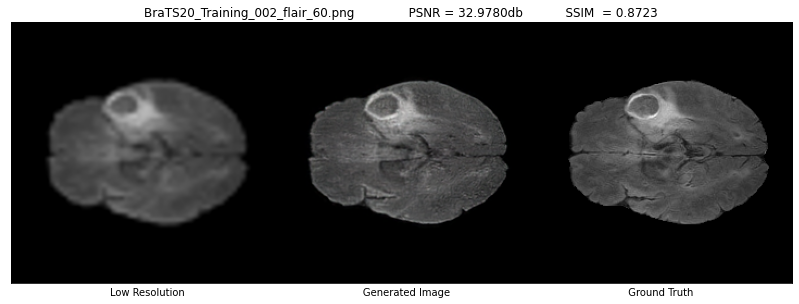

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_104.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_104.png


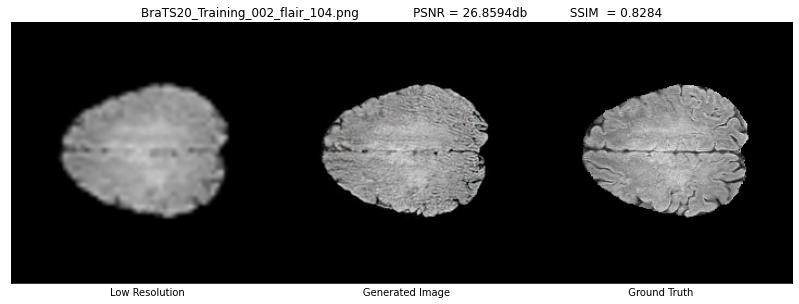

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_68.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_68.png


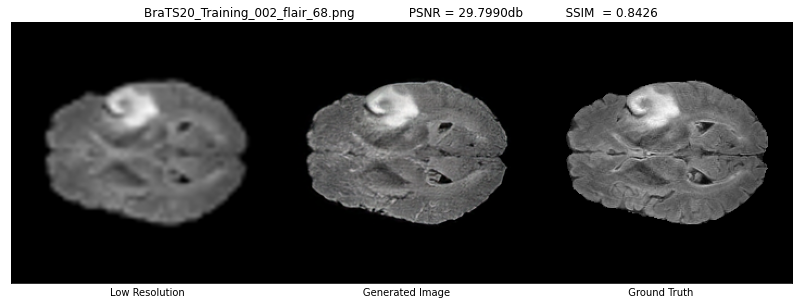

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_59.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_59.png


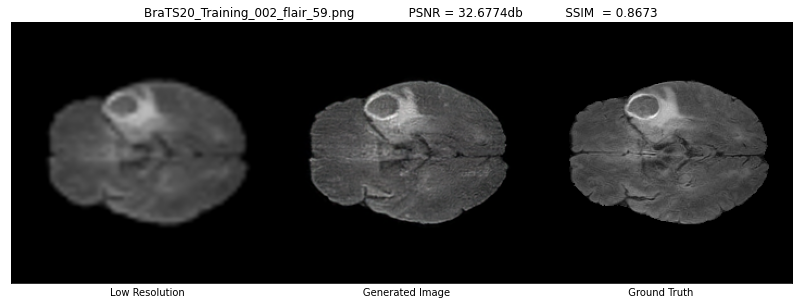

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_49.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_49.png


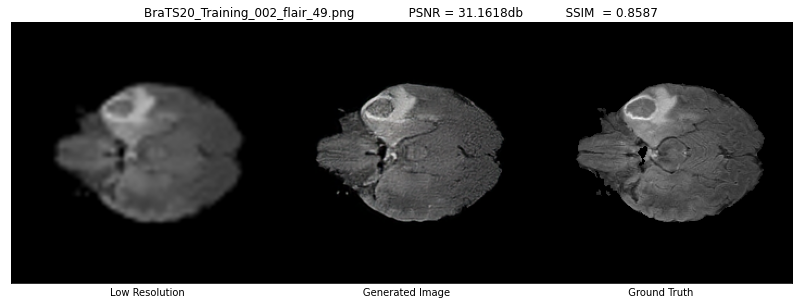

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_85.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_85.png


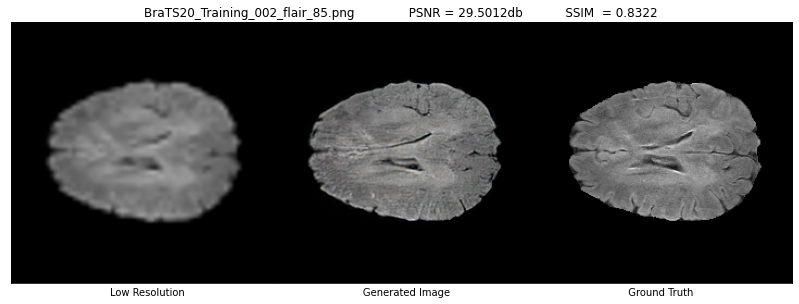

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_120.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_120.png


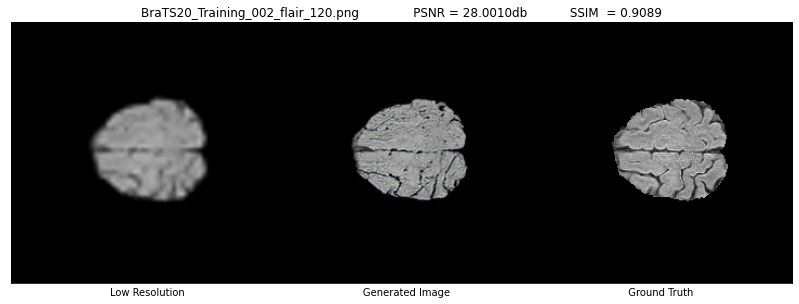

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_110.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_110.png


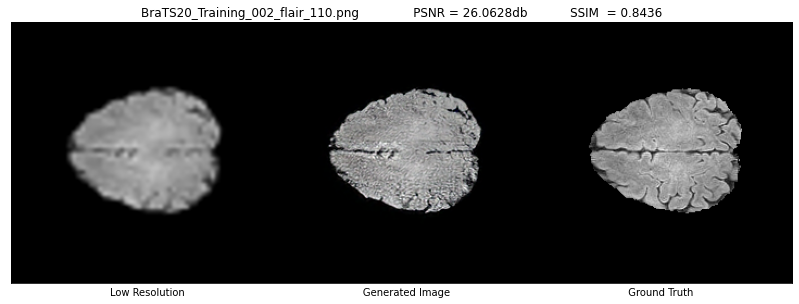

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_53.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_53.png


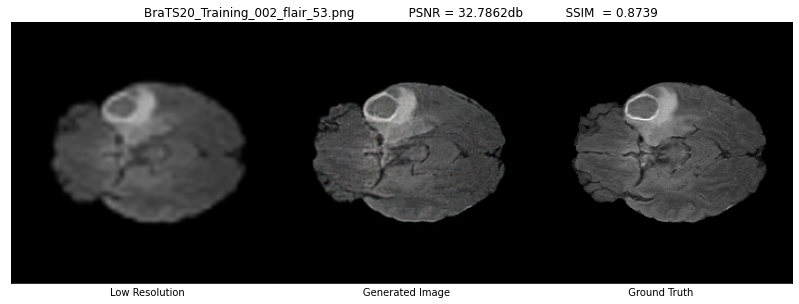

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_90.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_90.png


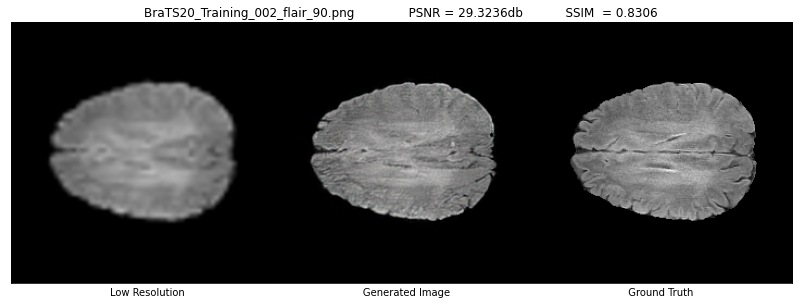

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_50.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_50.png


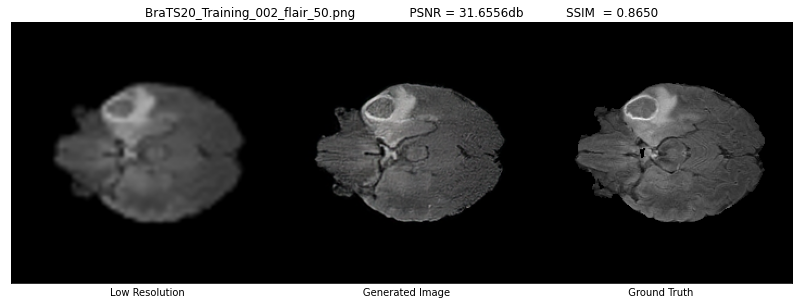

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_37.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_37.png


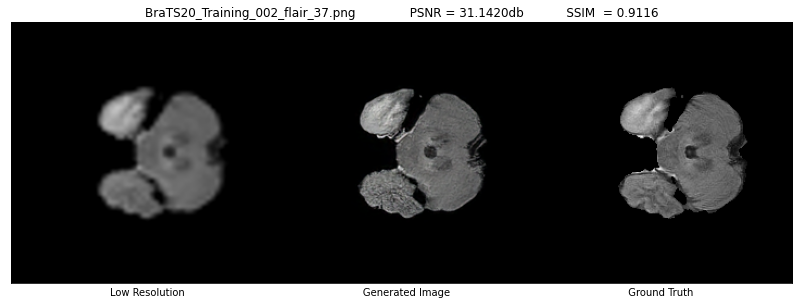

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_75.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_75.png


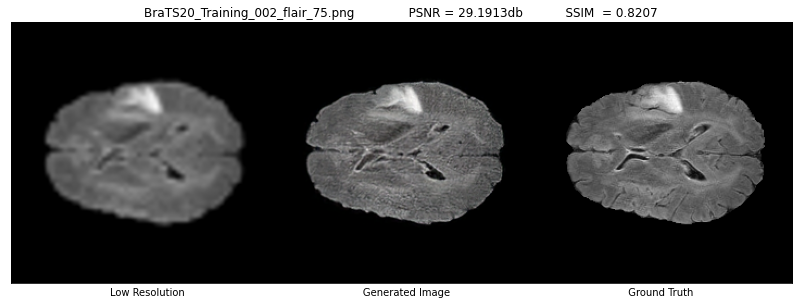

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_92.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_92.png


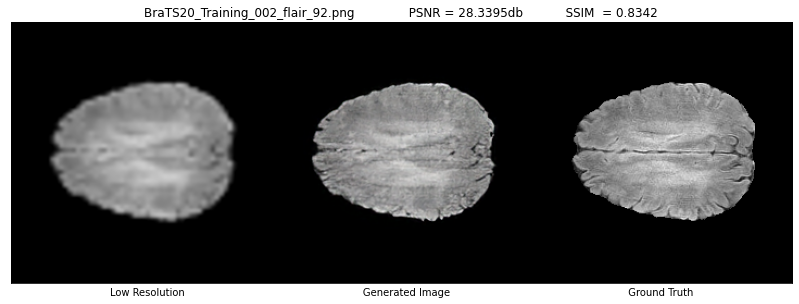

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_33.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_33.png


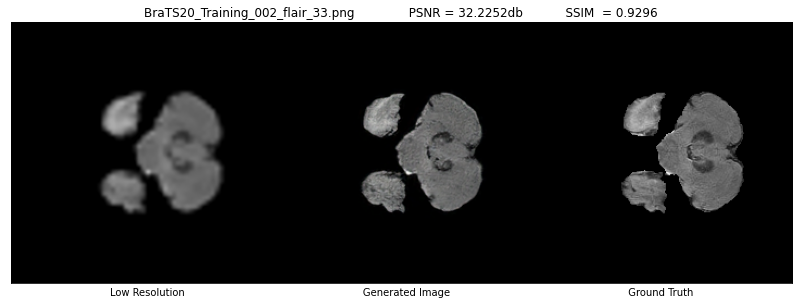

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_98.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_98.png


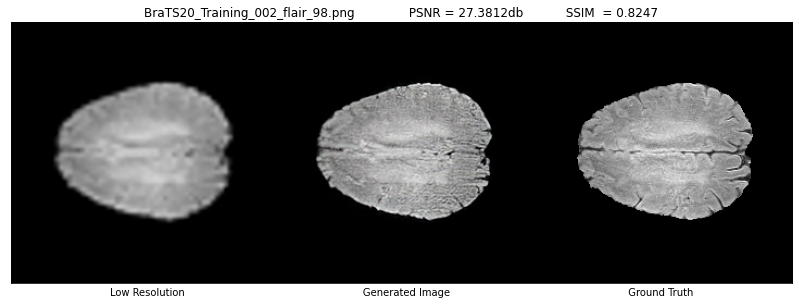

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_45.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_45.png


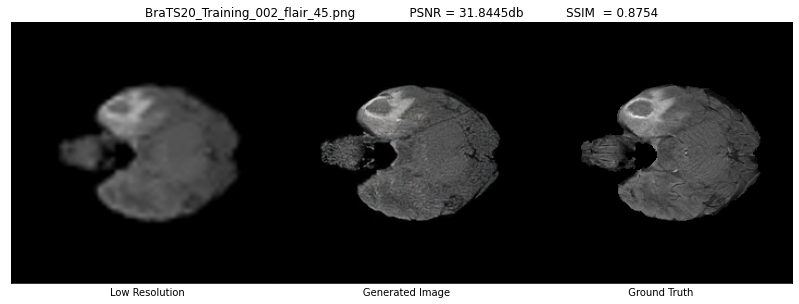

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_114.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_114.png


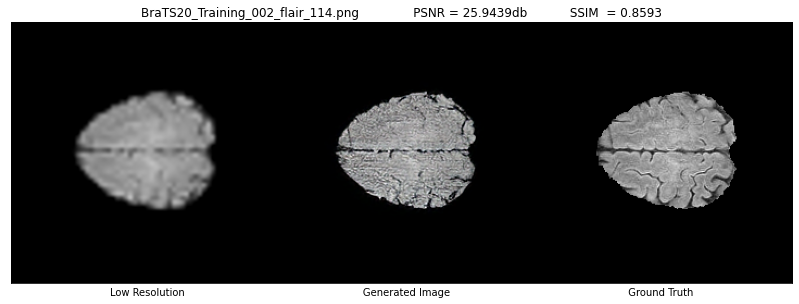

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_46.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_46.png


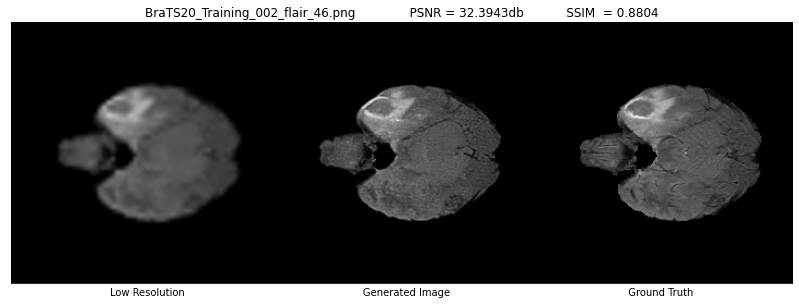

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_116.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_116.png


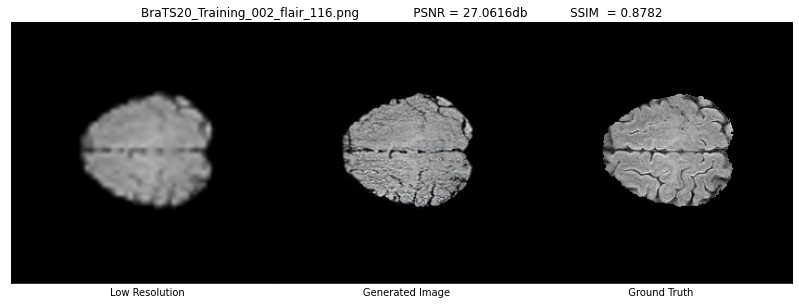

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_97.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_97.png


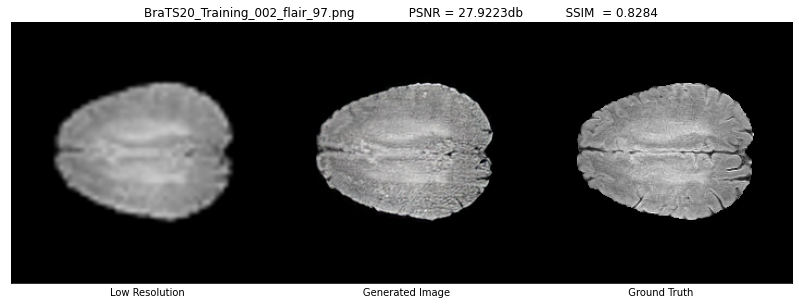

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_54.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_54.png


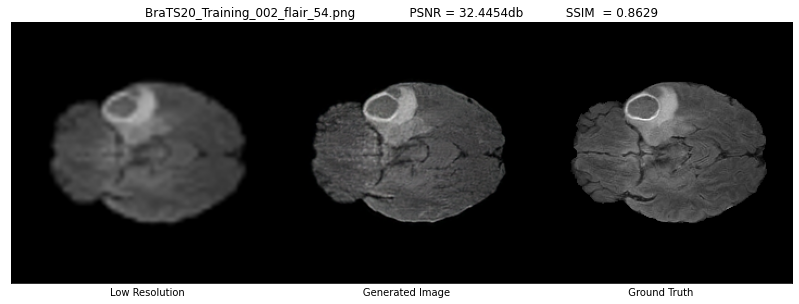

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_82.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_82.png


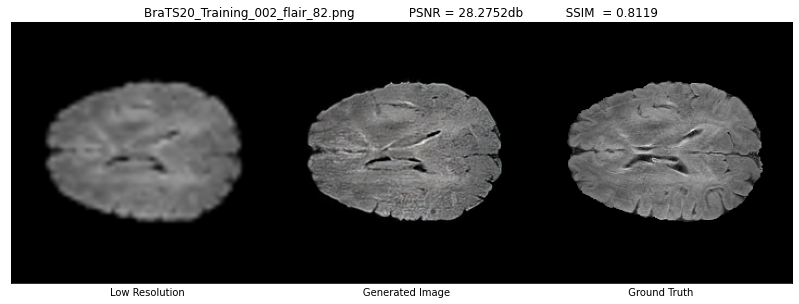

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_44.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_44.png


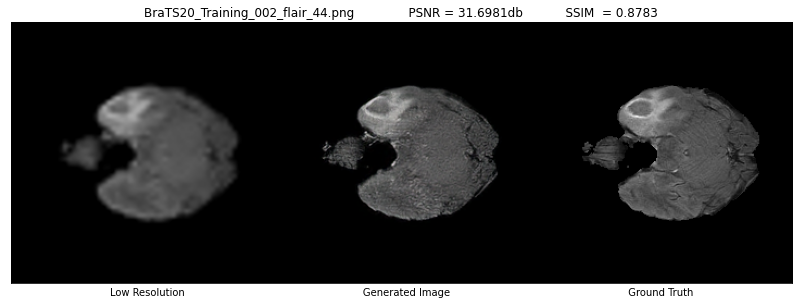

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_118.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_118.png


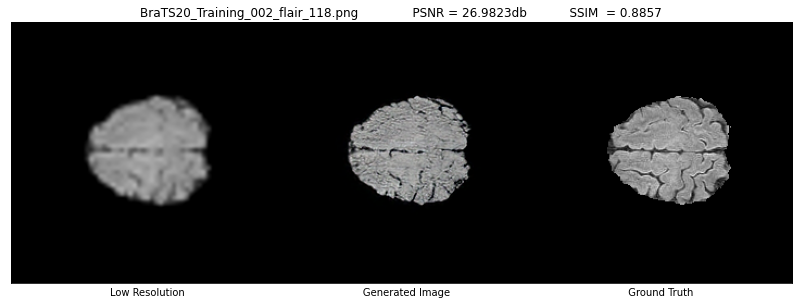

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_117.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_117.png


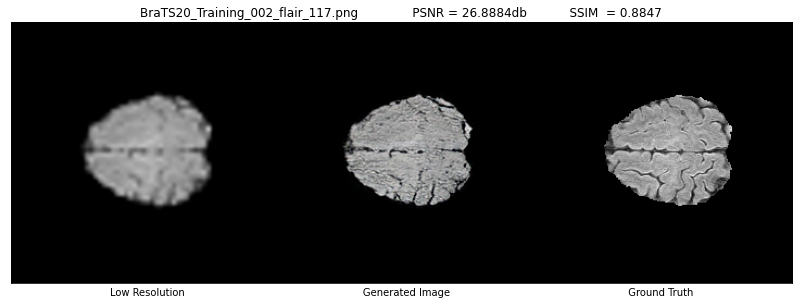

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_100.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_100.png


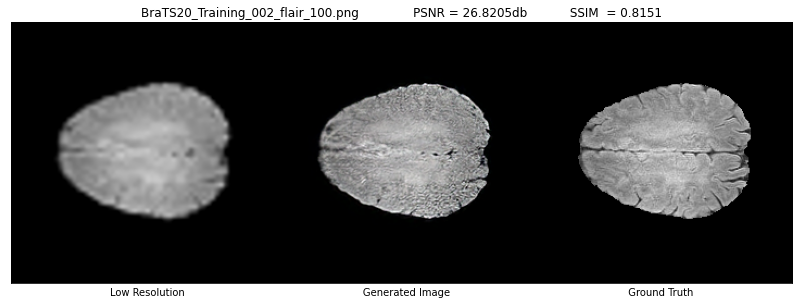

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_70.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_70.png


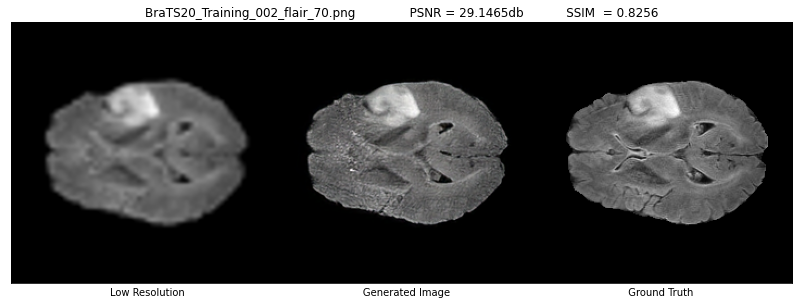

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_80.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_80.png


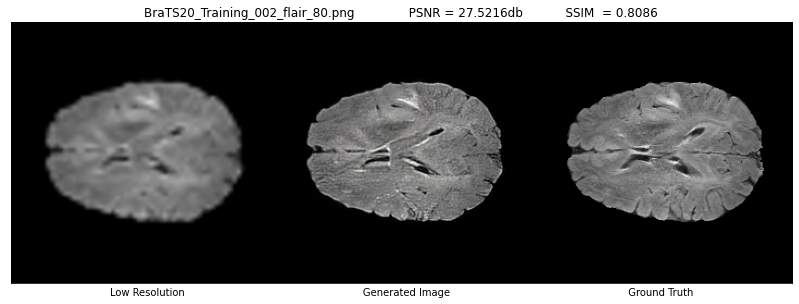

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_72.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_72.png


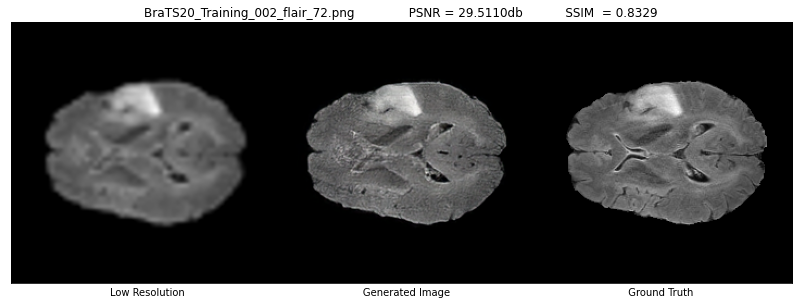

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_94.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_94.png


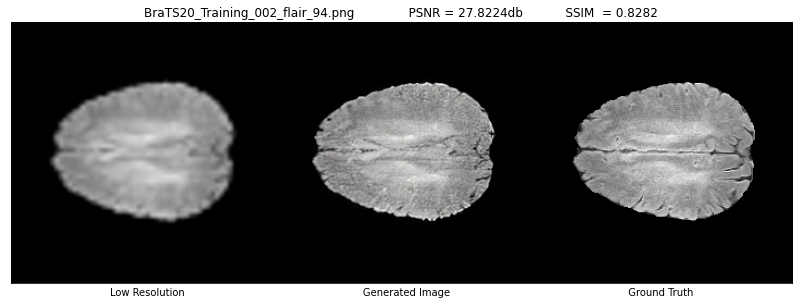

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_105.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_105.png


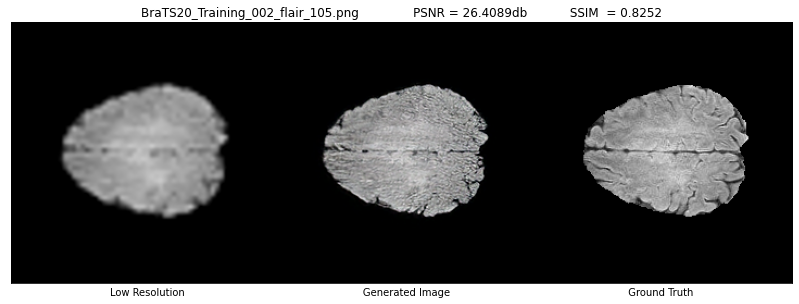

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_35.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_35.png


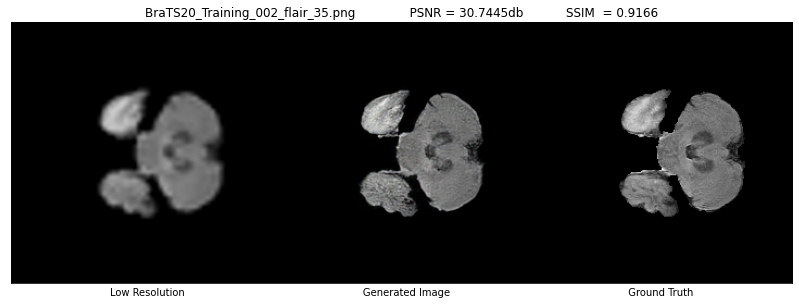

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_67.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_67.png


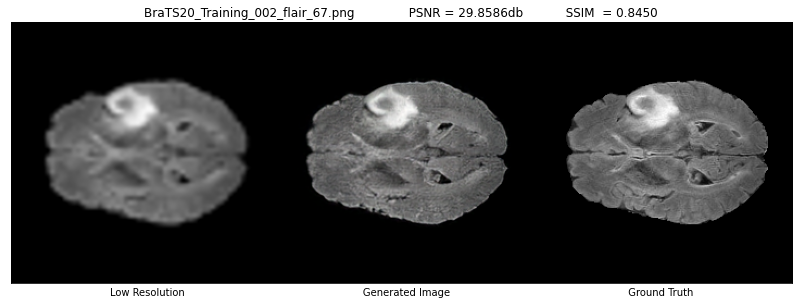

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_88.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_88.png


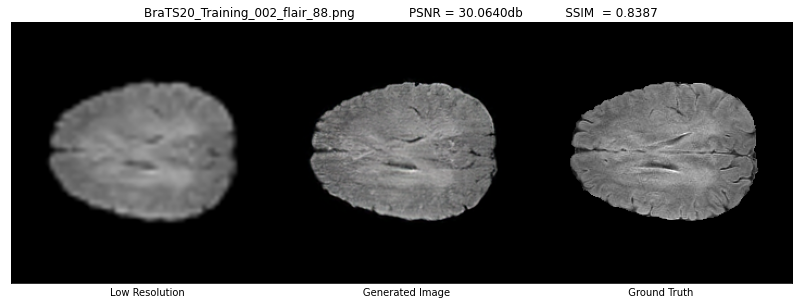

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_39.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_39.png


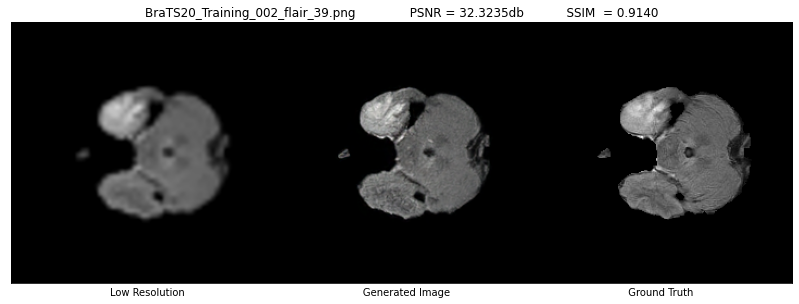

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_51.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_51.png


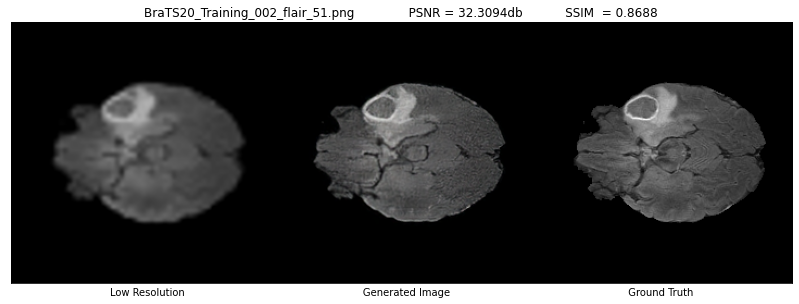

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_91.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_91.png


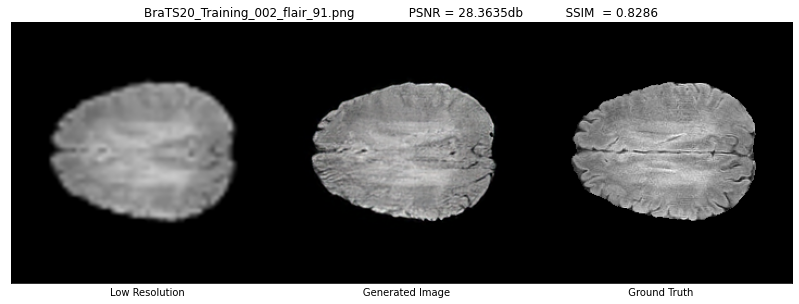

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_48.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_48.png


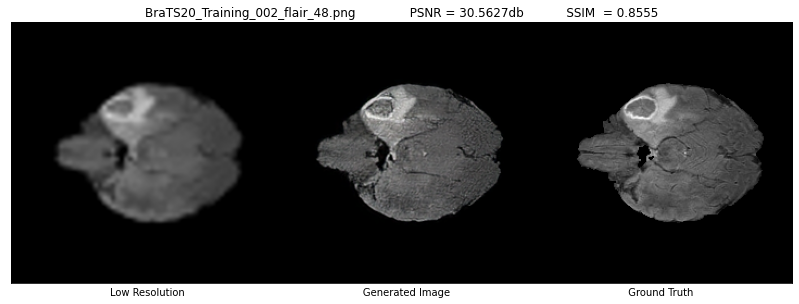

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_52.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_52.png


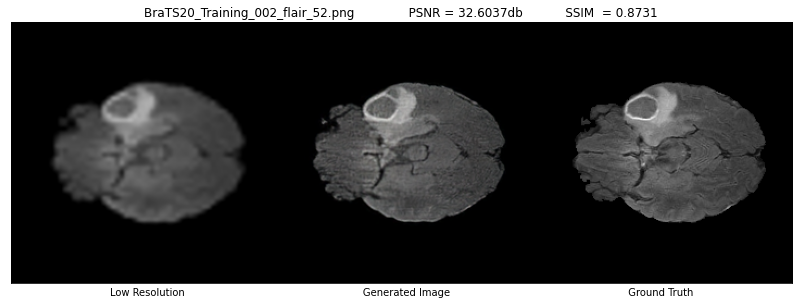

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_73.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_73.png


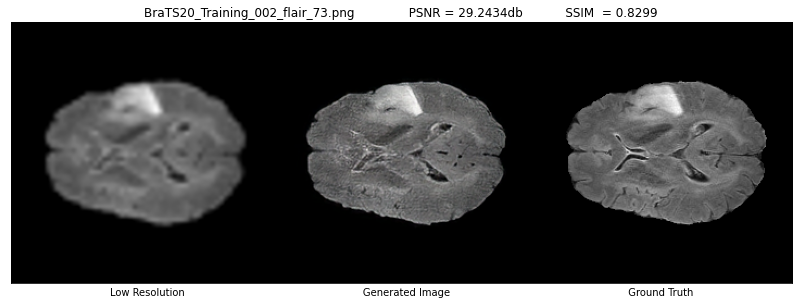

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_84.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_84.png


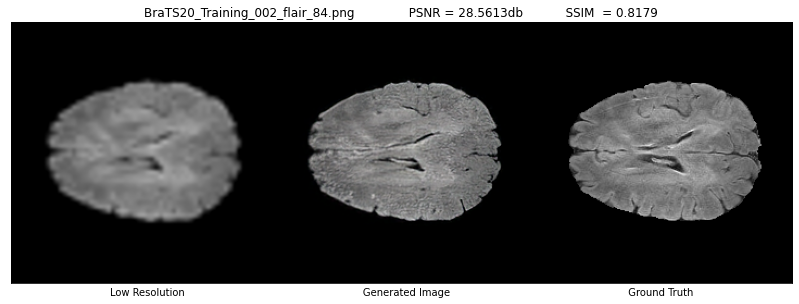

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_109.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_109.png


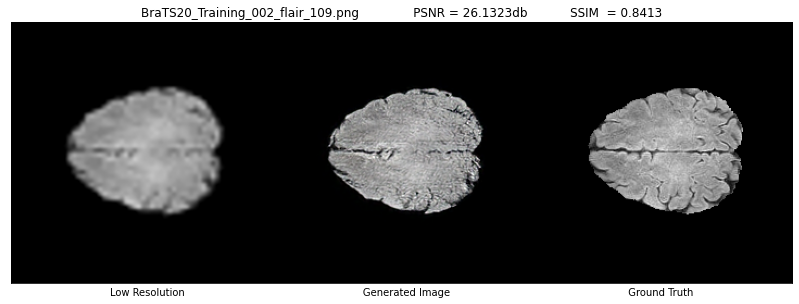

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_87.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_87.png


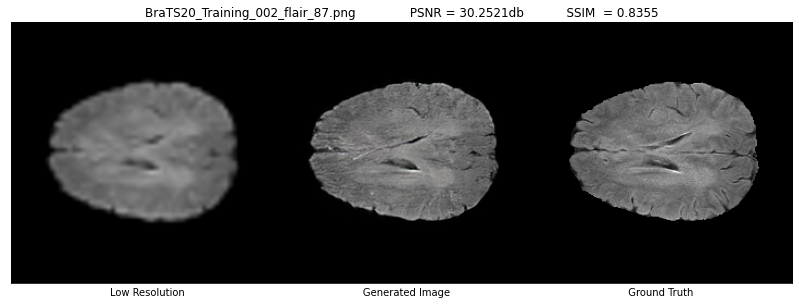

[*] load ckpt from ./checkpoints/esrgan/ckpt-581.
[*] Processing on single image /content/esrgan-tf2/train/BraTS20_Training_002_flair_111.png
[*] write the result image /content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_111.png


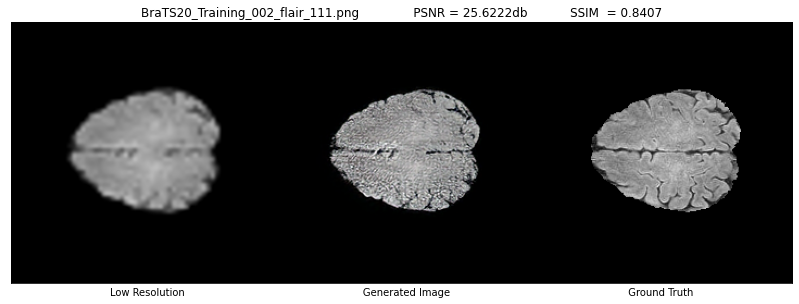

In [ ]:
import glob, os
from tqdm.notebook import tqdm
import gc
psnr_l = []
ssim_l = []
img_name = []
cfg_path = './configs/esrgan.yaml'
gpu = '0'
images = glob.glob('/content/esrgan-tf2/train/*')
for img in tqdm(images):
  psnr_sr, ssim_sr = main(img_path = img, cfg_path=cfg_path, gpu=gpu)
  img = os.path.basename(img)
  img_name.append(img)
  psnr_l.append(psnr_sr)
  ssim_l.append(ssim_sr)
  gc.collect()

In [ ]:
!zip -r ESRGANResuls.zip /content/ESRGAN_Result

updating: content/ESRGAN_Result/ (stored 0%)
updating: content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_53.png (deflated 2%)
updating: content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_52.png (deflated 2%)
updating: content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_45.png (deflated 2%)
updating: content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_94.png (deflated 2%)
updating: content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_122.png (deflated 3%)
updating: content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_73.png (deflated 1%)
updating: content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_35.png (deflated 3%)
updating: content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_42.png (deflated 2%)
updating: content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_112.png (deflated 2%)
updating: content/ESRGAN_Result/Bic_SR_HR_BraTS20_Training_002_flair_80.png (deflated 1%)
updating: content/ESRGAN_Result/Bic_SR_HR_BraTS20_Tra

In [ ]:
import pandas as pd

df = pd.DataFrame()
df["Image_Name"] = img_name 
df["PSNR"] = psnr_l 
df["SSIM"] = ssim_l 
df.to_csv("result.csv", index=False)

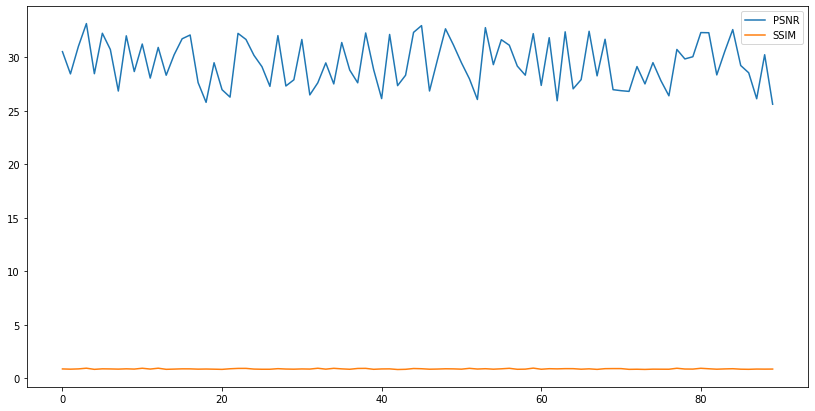

In [ ]:
df.plot(figsize=(14, 7))
plt.show()